## Section 2 Exercise 1: Create a prediction model

## Introduction

Prediction is an important part of spatial data science. You can use prediction to forecast future values (for example, predicting tomorrow's air quality for a specified location), downscale information (for example, using voter turnout data at the county level to predict voter turnout at the census tract level), or fill in missing values in a dataset.

ArcGIS provides various prediction tools to help you complete these types of analyses. In this exercise, you will use the Forest-based Classification and Regression tool, which uses an adaptation of Leo Breiman's random forest algorithm. This supervised machine learning algorithm allows you to use existing data to train models that may be useful for predictive analysis.

The tool creates many decision trees, called an ensemble or a forest, that are used for prediction. Each tree generates its own prediction and is used as part of a voting scheme to make final predictions. The strength of the forest-based method is in capturing commonalities of weak predictors (the trees) and combining them to create a powerful predictor (the forest). You will use this tool to train and evaluate a predictive model, modifying variables and parameters to improve the model performance.

## Scenario

After preparing and visualizing your data, you are ready to begin your predictive analysis, and you will create models that predict voter turnout. These models will use `explanatory variables`, such as `income` and `age`, to predict the `dependent variable`, which is `voter turnout`.

You will use this model to downscale voter turnout from the county level to the census tract level. This information will be used to organize a "Get Out the Vote" canvassing campaign. These campaigns encourage people to vote on Election Day. This model will help identify local regions that are expected to have low voter turnout so that you know where to target your campaign.

### **Step 1: Download the exercise data files**

In this step, you will download the exercise data files.

1. Open a new web browser tab or window.

2. Go to https://links.esri.com/Section02/DataOpens in new window and download the exercise data ZIP file.

>Note: The complete URL to the exercise data file is https://www.arcgis.com/home/item.html?id=6c177c0b07ca481698065354b958c8d9Opens in new window.

3. Extract the files to the EsriTraining folder on your local computer.

You downloaded and extracted the exercise data files that you will need to complete this section of the MOOC.

### **Step 2: Open an ArcGIS Pro project**

In this step, you will open the ArcGIS Pro project that you downloaded.

1. Start ArcGIS Pro.

2. If necessary, sign in using your course ArcGIS account username and password.

>Note: Exercise 1 in Section 1 explains where to locate your course account information to sign in to ArcGIS Pro. If you have trouble signing in, refer to the Common Questions list on the Help tab of the MOOC home page.

3. On the Start page, near Recent Projects, click Open Another Project.

>Note: If you have configured ArcGIS Pro to start without a project template or with a default project, you will not see the Start page. On the Project tab, click Open, and then click Open Another Project.

4. In the Open Project dialog box, browse to the Prediction folder that you saved on your computer.

5. Click Prediction.aprx to select it, and then click OK.

A Prediction map tab opens to a gray basemap with a map layer that represents the 2020 election results for each county in the United States. Counties with a voter turnout value below the mean are purple, and counties with a voter turnout value above the mean are green.

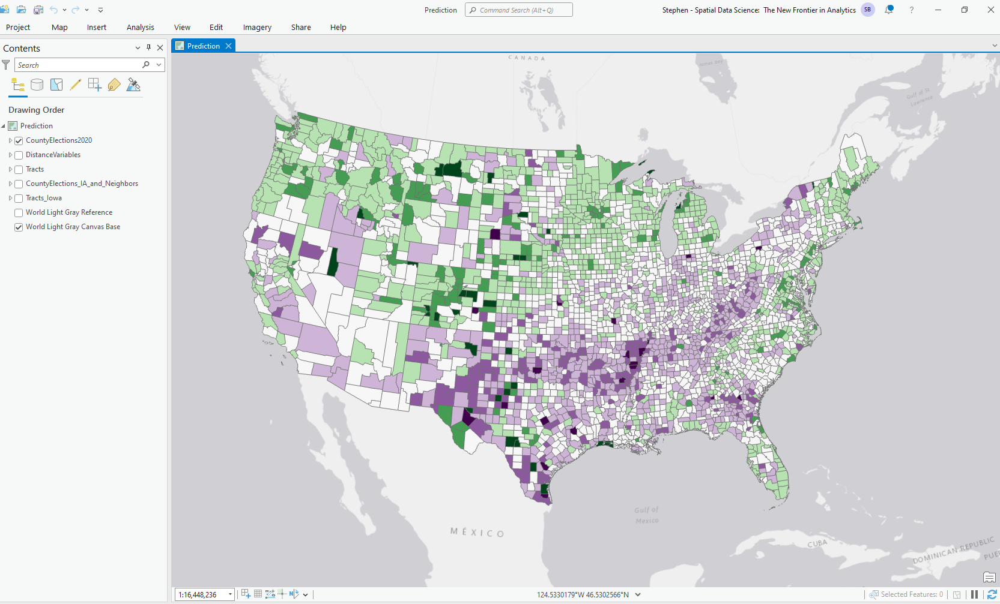


### **Step 3: Create a prediction model**

During the previous data engineering exercise, you learned how to enrich election data with various demographic variables. During the data visualization exercise, you explored the relationship of these variables to voter turnout, identifying variables that have a strong relationship to voter turnout. You will use these variables in your first prediction model.

In this step, you will create a prediction model using the Forest-based Classification and Regression tool.

1. From the Analysis tab, in the Geoprocessing group, click Tools.

2. In the Geoprocessing pane, search for `Forest-based Classification And Regression`.

3. In the search results, click Forest-based Classification And Regression (Spatial Statistics Tools).

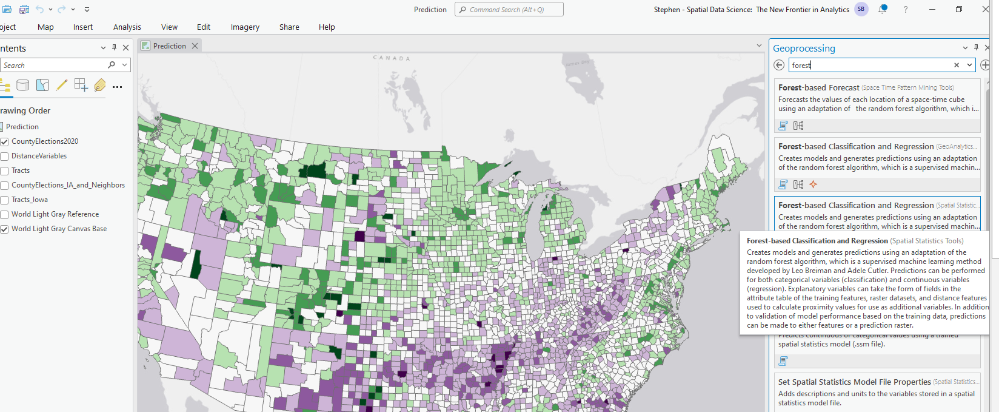

>Note: Be sure to use the Spatial Statistics tool and not the GeoAnalytics Desktop tool.

The Forest-based Classification and Regression tool opens in the Geoprocessing pane.

4. In the Geoprocessing pane, set or confirm the following parameters:

- Prediction Type: `Train only`
- Input Training Features: `CountyElections2020`
- Variable To Predict: `voter_turnout_2020`

5. Under Explanatory Training Variables, next to Variable, click the Add Many button .

6. In the Variable window, check the boxes for the following variables:

- 2022 Median Age
- 2022 Per Capita Income
- 2022 Pop Age 25+: High School/No Diploma: Percent

7. In the bottom-right corner of the Variable window, click Add.

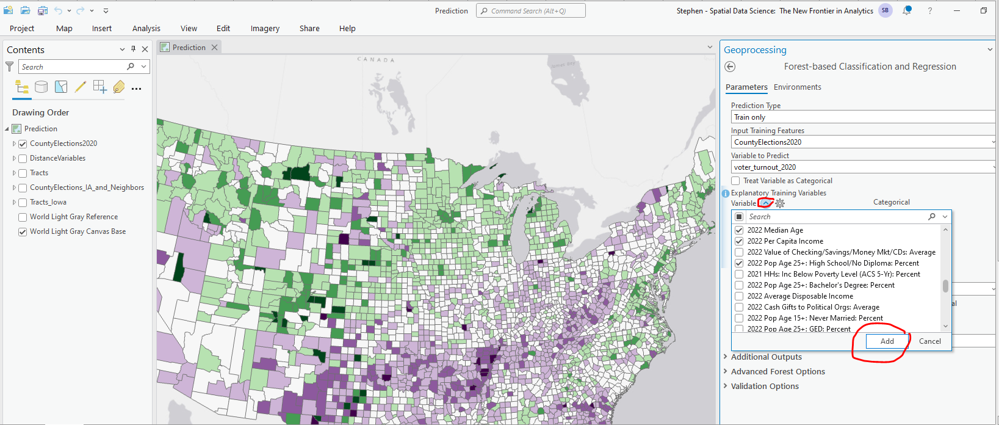

The selected variables are added to the tool's parameters.

8. In the Geoprocessing pane, expand Additional Outputs.

9. Under Additional Outputs, specify the following parameters:

- Output Trained Features: `Out_Trained_Features`
- Output Variable Importance Table: `Out_Variable_Importance_Table`

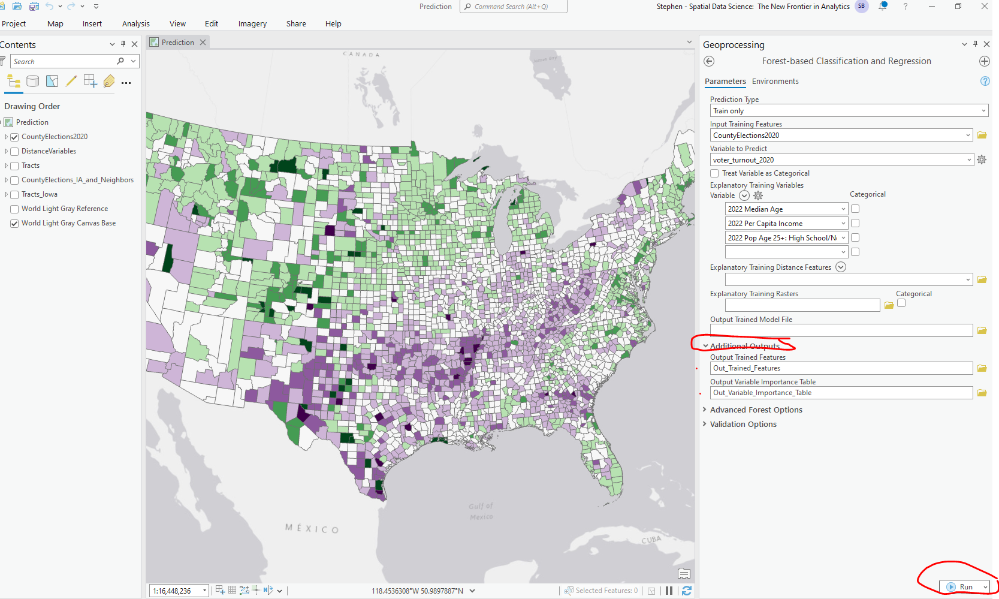


10. In the Geoprocessing pane, click Run.

You created a prediction model by running the tool. At the bottom of the Geoprocessing pane, you will see a message confirming that the tool completed successfully. To understand how the model performed, you will review the model's performance metric using the tool messages.

11. At the bottom of the Geoprocessing pane, in the green message box, click `View Details`.

The Forest-based Classification And Regression (Spatial Statistics Tools) tool message window appears. Tool messages contain information like the parameters that were used to run the tool, how long the tool ran, and model performance diagnostics.

12. On the Messages tab, scroll down and locate the Training Data: Regression Diagnostics section.


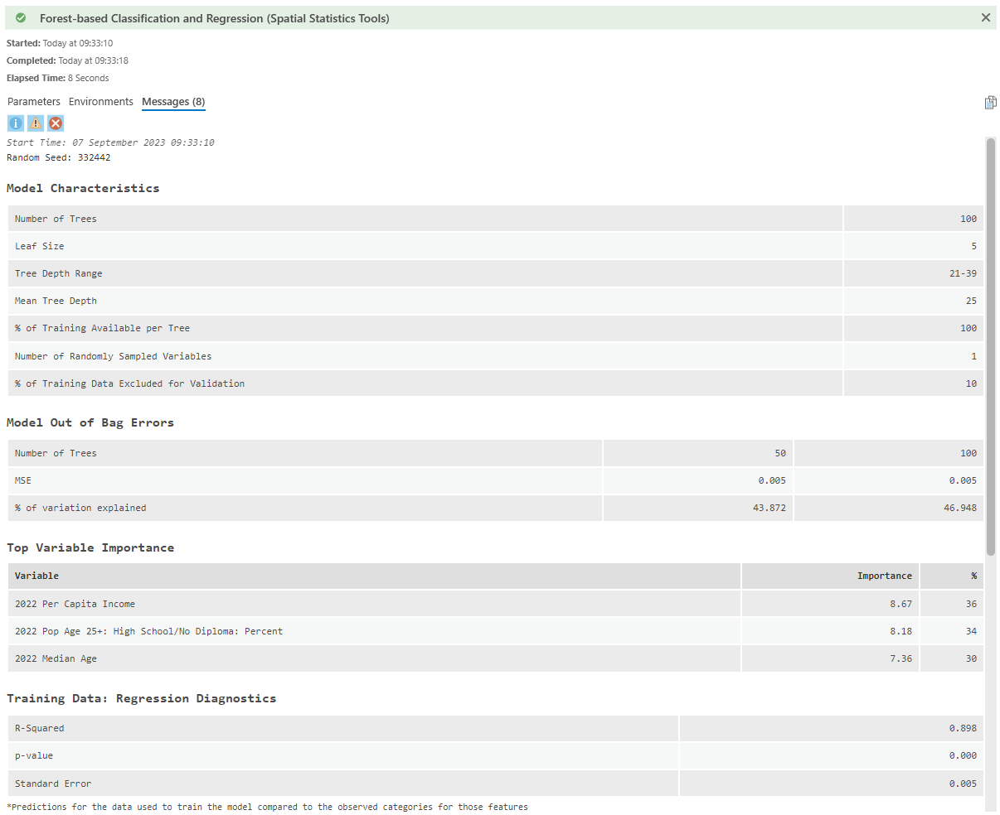

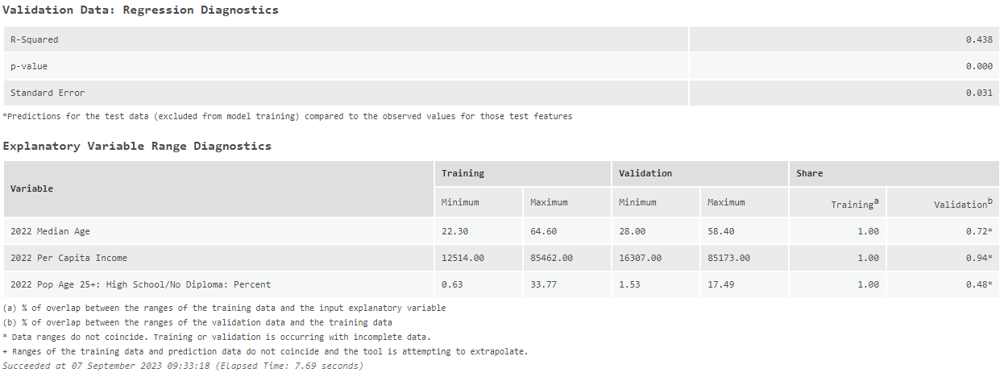

>Note: Each time that you run the Forest-based Classification and Regression tool, you may get slightly different results due to the randomness introduced in the algorithm to prevent the model from overfitting to the training data.

By default, forest-based classification and regression reserves 10 percent of the data for validation. The model is trained without this random subset, and the tool returns an R-squared value that measures how well the model performed on the unseen data.

When a model is evaluated based on the training dataset rather than a validation dataset, it is common for estimates of performance to be overstated due to a concept called overfitting. Therefore, the validation R-squared value is a better indicator of model performance than the training R-squared value. The model returned a validation R-squared value of `0.438`, indicating that the model predicted the voter turnout value in the validation dataset with an accuracy of about 44 percent.

13. Close the Forest-based Classification And Regression tool message window.

14. In the Contents pane, turn off the CountyElections2020 layer.

You will review how important each explanatory variable was in generating a prediction. The `Out_Trained_Features` layer displays the predicted voter turnout for each county in the contiguous United States. A variable importance table and associated bar chart are added to the Contents pane and can be used to explore which variables were most important in this prediction.

15. In the Contents pane, open the Summary Of Variable Importance chart.

Under Charts, right-click Summary Of Variable Importance and choose Open.


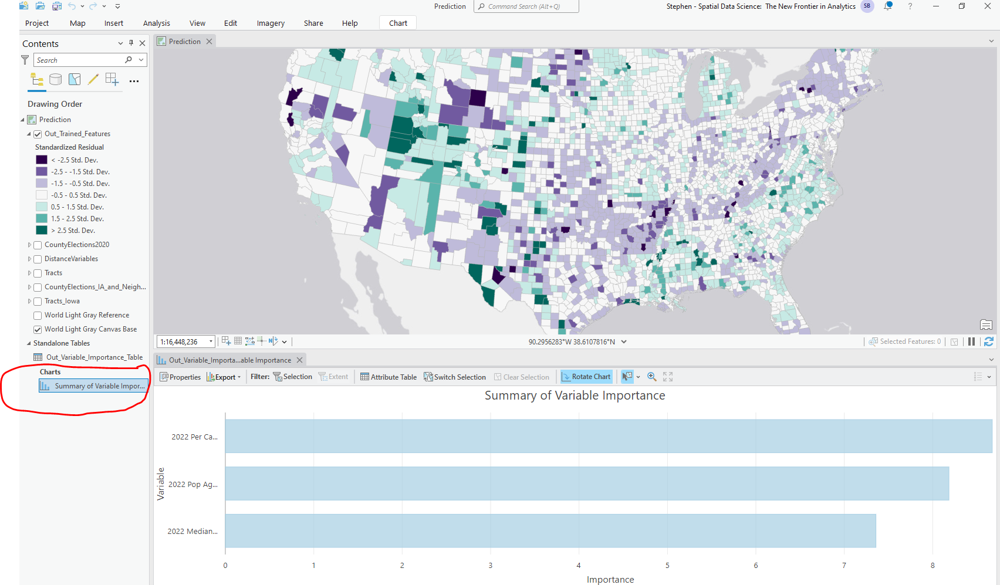

The 2022 Per Capita Income and 2022 Pop Age 25+: High School/No Diploma: Percent variables have the highest importance, meaning that they were the most useful in predicting voter turnout.

As previously mentioned, each time that you run the Forest-based Classification and Regression tool, you may get slightly different results due to the randomness introduced in the algorithm. To understand and account for this variability, you will use a parameter that allows the tool to create multiple models in one run. This output will allow you to explore the distribution of model performance.

16. Close the Summary Of Variable Importance chart.

To learn more about the Forest-based Classification and Regression (Spatial Statistics) tool, go to ArcGIS Pro Help: [Forest-based Classification and Regression (Spatial Statistics)](https://pro.arcgis.com/en/pro-app/latest/tool-reference/spatial-statistics/forestbasedclassificationregression.htm).

>Note: Throughout this exercise, you will rerun the Forest-based Classification and Regression (Spatial Statistics Tools) geoprocessing tool using different variables and parameters. Read each step thoroughly, and carefully change the tool's parameters to match the instructions in this exercise.

### **Step 4: Examine model stability**

In this step, you will review the prediction intervals in this model to see whether the model's performance is relatively stable across all values.

1. Return to the Geoprocessing pane `Forest-based Classification and Regression (Spatial Statistics)`

2. Near the bottom of the Geoprocessing pane, expand Validation Options.

3. For Number Of Runs For Validation, type `10`, and then click in the empty gray space of the Geoprocessing pane so that the tool recognizes your update.

The Geoprocessing pane will refresh, and the option for Output Validation Table will appear. This option appears only when the specified number of runs for validation is greater than 2. This table creates a histogram of the distribution of R-squared values for the model.

4. For Output Validation Table, type `Out_Validation_Table`.

5. Under Output Validation Table, click the check box for Calculate Uncertainty.

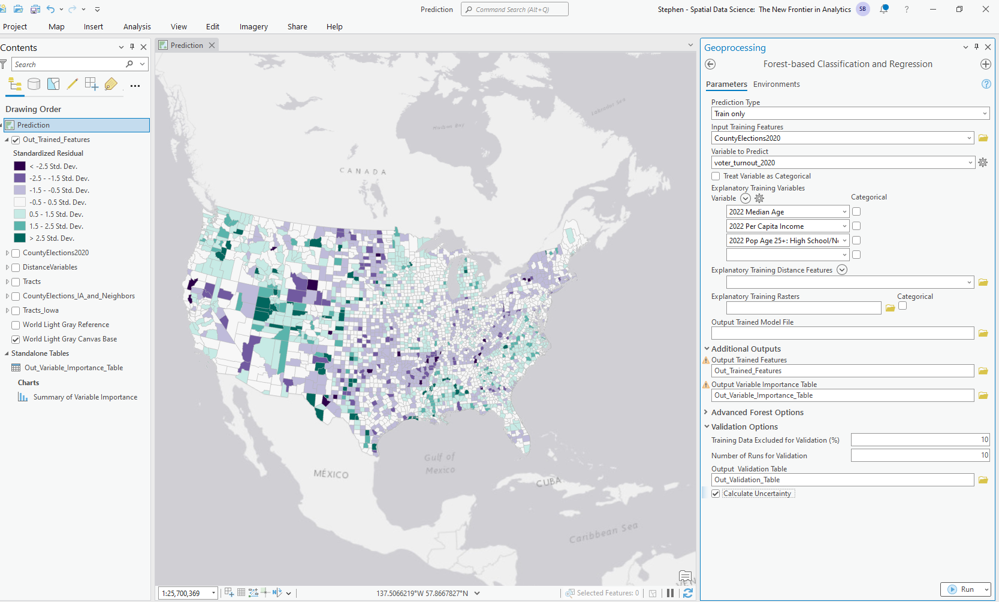

>Note: If you do not see the Calculate Uncertainty check box, scroll down in the Geoprocessing pane.

6. Run the tool.

7. At the bottom of the Geoprocessing pane, click View Details.

8. In the tool message window, from the Messages tab, scroll to the Validation Data: Regression Diagnostics section.

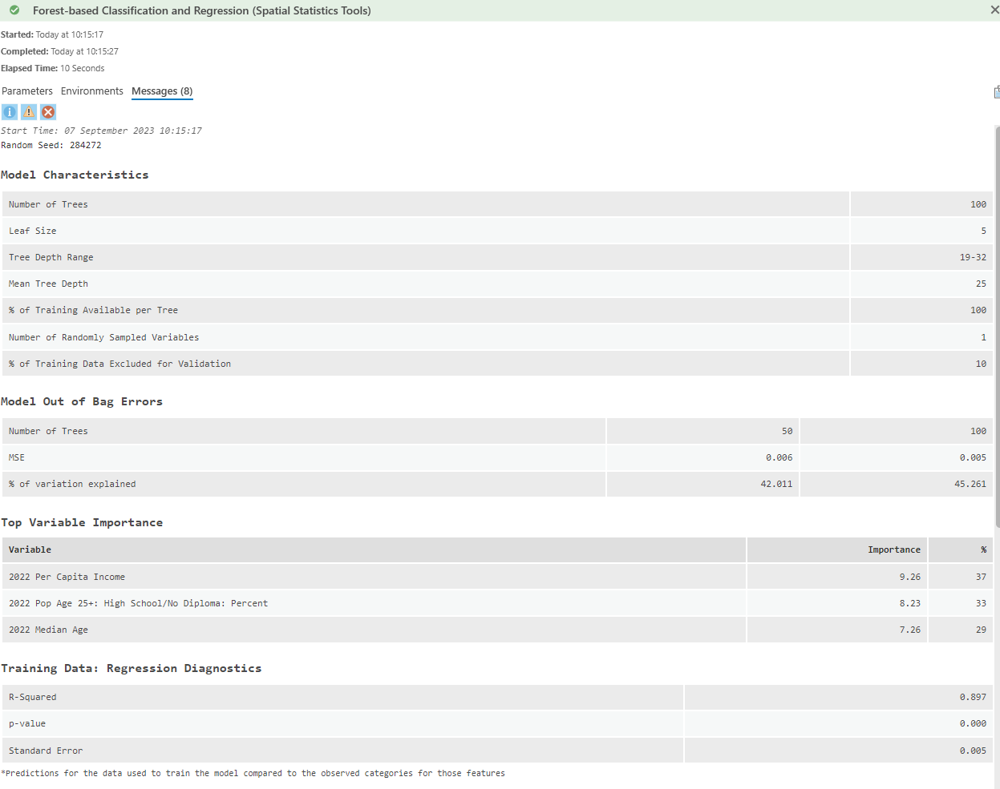

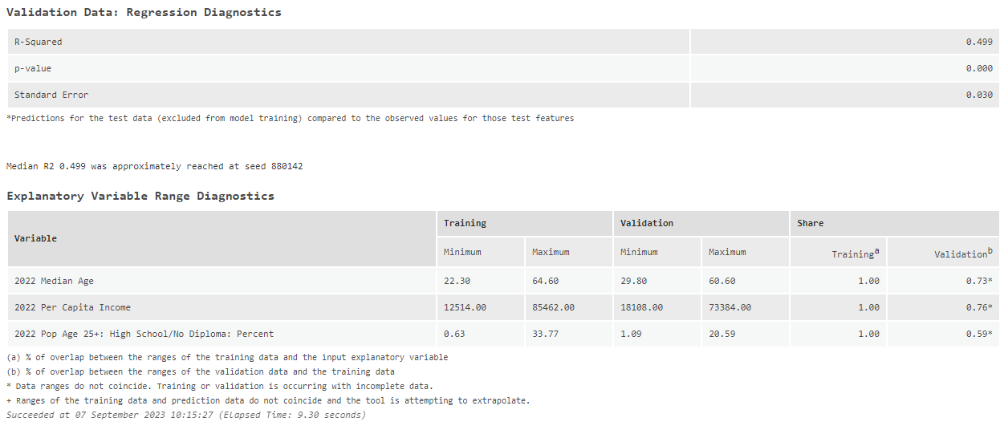

>Note: Each time that you run the Forest-based Classification and Regression tool, you may get slightly different results due to the randomness introduced in the algorithm to prevent the model from overfitting to the training data.

The tool trained 10 models with random subsets of validation data. In the example shown here, the most representative R-squared value (`median`) across the 10 runs is `0.499`, corresponding to about 50 percent accuracy in prediction of the validation data. You can use a histogram to review the distribution of R-squared values returned over the 10 runs. 

9. Close the tool message window.

10. In the Contents pane, in the Standalone Tables section, open the Validation R2 chart.

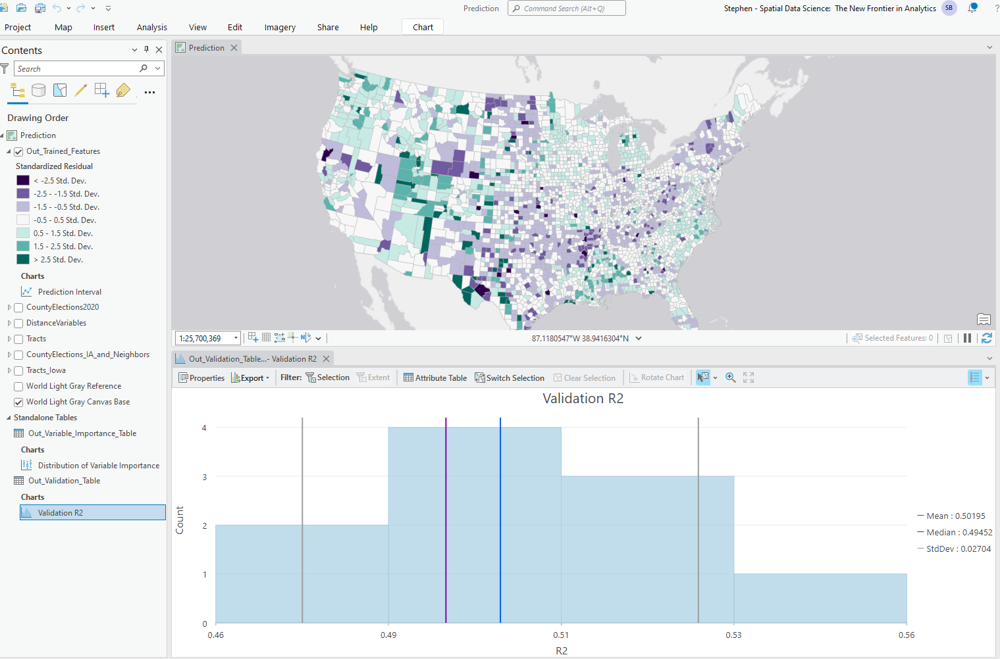

The histogram shows the variability in model performance by visualizing the distribution of R-squared values returned over the 10 runs. The `mean` R-squared value for the 10 runs of this model is `0.50195`.

11. In the Contents pane, open the Distribution Of Variable Importance chart.

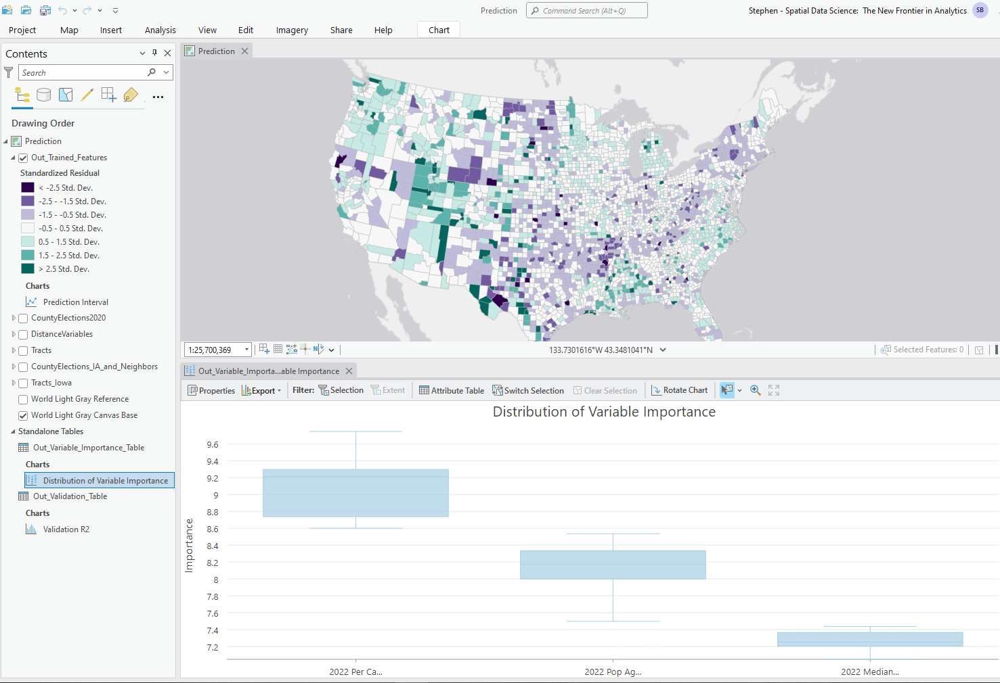

Instead of a bar chart, the variable importance is visualized using a box plot to show the distribution of importance across the 10 runs of the model. In some runs of the model, Per Capita Income was more important, and in other runs, Pop Age 25+: High School/No Diploma: Percent was also important. Overall, both variables are strong candidates for your predictive model.

To learn more about the Distribution Of Variable Importance box plot, go to ArcGIS Pro Help: [Output messages and diagnostics](https://pro.arcgis.com/en/pro-app/latest/tool-reference/spatial-statistics/how-forest-works.htm#ESRI_SECTION1_E010566C782444E2B2364442355FC50D).

12. In the Contents pane, under `Out_Trained_Features`, right-click `Prediction Interval` and choose Open.

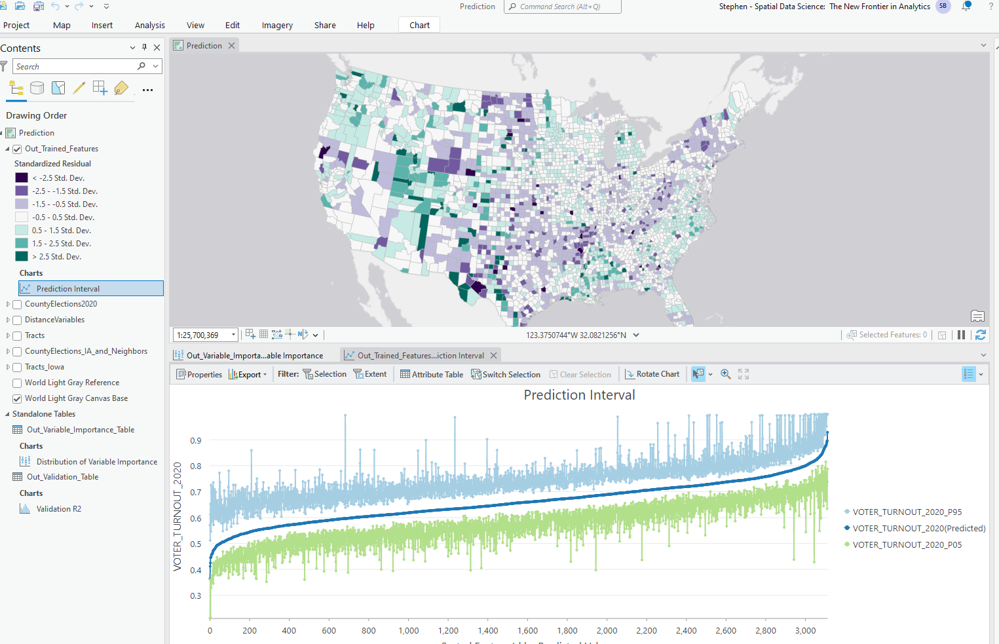

The Prediction Interval chart displays the level of uncertainty for any given prediction value. By considering the range of prediction values returned by the individual trees in the forest, prediction intervals are generated, indicating the range in which the true value is expected to fall. You can be 90 percent confident that new prediction values generated using the same explanatory variables would fall in this range. This chart can help you identify whether the model is better at predicting some values than others. For example, if the confidence intervals were much larger for low voter turnout values, then you would know that the model is not as stable for predicting low voter turnout as it is for predicting high voter turnout. The prediction intervals in this model are fairly consistent, indicating that the model performance is relatively stable across all values.

To learn more about the Prediction Interval chart, go to ArcGIS Pro Help: [Advanced forest options](https://pro.arcgis.com/en/pro-app/latest/tool-reference/spatial-statistics/how-forest-works.htm#ESRI_SECTION1_1B54DEFD180C404D844EAB95DD5B2FAA).

At this point, you have used the attributes in your dataset as the explanatory variables in your model. 

13. Close the charts and activate the Geoprocessing pane.

### **Step 5: Add many variables to a prediction model**

The Forest-based Classification and Regression tool uses a random subset of the available explanatory variables in each decision tree. Commonalities in the predictions and variables used among all the trees in the forest are quantified in the variable importance diagnostic. In general, that means that you can test adding variables to the model without diminishing the model's predictive power. Variables that are useful result in higher variable importance scores, and variables that are not useful result in lower variable importance scores.

In this step, you will add variables to your model to see if they enhance your model's performance for predicting voter turnout.

1. In the Geoprocessing pane, under Explanatory Training Variables, click the Add Many button .

2. Check the boxes for the following variables to add them to your model:

- pop_sqmi
- state_abbr
- voter_turnout_2008
- voter_turnout_2012
- voter_turnout_2016
- 2022 Value Of Checking/Savings/Money Mkt/CDs: Average
- 2021 HHs: Inc Below Poverty Level (ACS 5-Yr): Percent
- 2022 Pop Age 25+: Bachelor's Degree: Percent
- 2022 Average Disposable Income
- 2022 Cash Gifts To Political Orgs: Average
- 2022 Pop Age 15+: Never Married: Percent
- 2022 Pop Age 25+: GED: Percent
- 2022 Value Of Credit Card Debt: Average
- 2022 Pop Age 25+: High School Diploma: Percent
- 2022 Pop Age 25+: Grad/Professional Degree: Percent
- 2022 Pop Age 25+: < 9th Grade: Percent
- 2022 Average Household Income
- 2022 Dominant LifeMode Grp Code


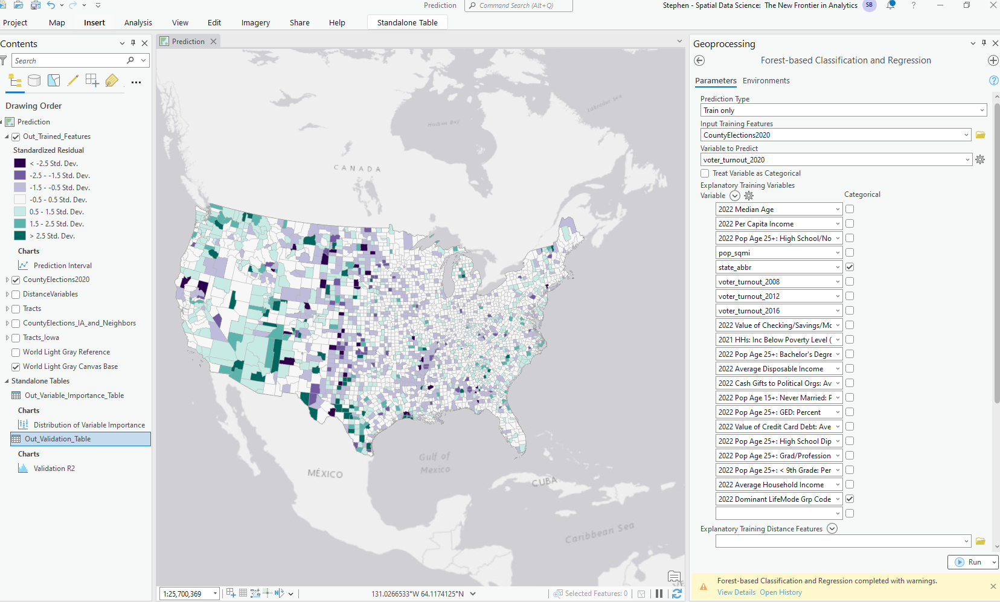



3. Click Add.

Many variables are now added as explanatory training variables. Voter turnout for 2020 is the variable that you are trying to understand, and the same variable should not be used as both the independent and dependent variables for this analysis. The Forest-based Classification and Regression tool can also use categorical variables, which are variables of a string field type instead of a numeric field type. The `state_abbr` and the `2022 Dominant LifeMode Grp Code` variables are both marked as `categorical variables` in the Explanatory Training Variables list. 

4. Run the tool.

5. Review the R-squared value in the validation data regression diagnostics.


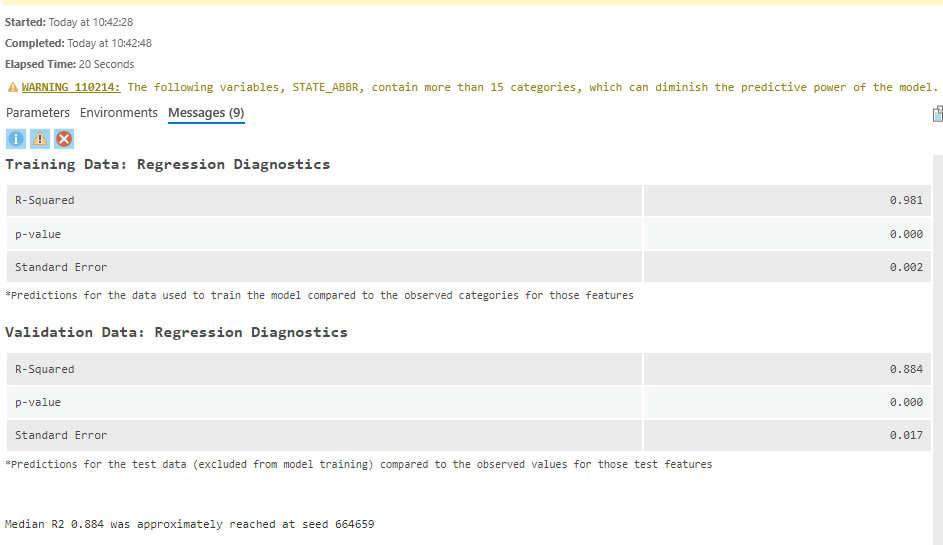


In this example, the model's R-squared value increased to `0.884`, which means that it is now predicting with around 88 percent accuracy based on the validation data. 

>Remember: you may see slightly different results due to the randomness introduced in the algorithm to prevent the model from overfitting to the training data. 

The warning that shows in the tool message window is because the `state_abbr` categorical variable contains more than 15 categories. The more categories that a variable contains, the more likely it is that the variable will dominate the model and lead to less effective prediction results. When you select variables for your model, consider this effect on results.

6. Close the tool message window.

7. Review the Distribution Of Variable Importance chart.

Under Charts, right-click Distribution Of Variable Importance and choose Open.

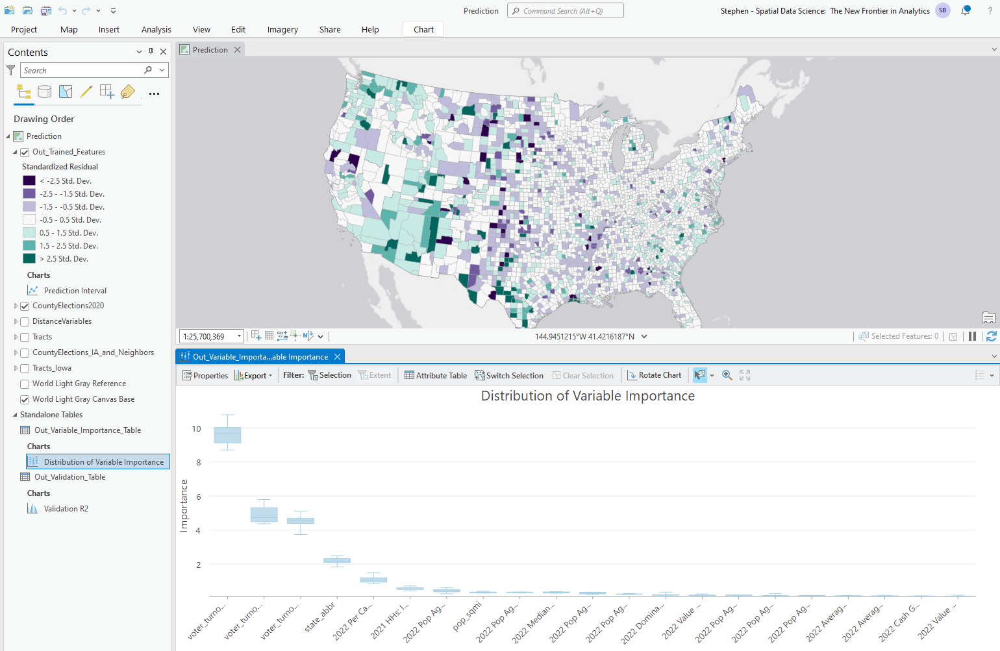

>Note: You can zoom in to the chart using the Zoom Mode button Zoom Mode or your mouse to better see the distribution for a particular variable. (If you do not see the Zoom Mode button, widen the chart view.)

The voter turnout variables have the highest variable importance in the model, but several new variables have contributed to the model and raised its performance. There are also several variables that may not be helping the model, represented by their low variable importance.

With the Forest-based Classification and Regression tool, you can also calculate new variables based on distances to meaningful locations. In the next step, you will calculate distance variables and assess their importance to the model.

8. Close the Distribution Of Variable Importance chart and activate the Geoprocessing pane.

### **Step 6: Add distance variables to the model**

You want to incorporate each county's urban and rural characteristics into the model to determine whether these variables improve voter turnout predictions. To represent urban and rural characteristics, you will calculate the distance between each county and cities of various sizes. The proximity to each of these cities will be used to represent the urban and rural characteristics, with more rural counties being farther from cities.

1. In the Contents pane, turn off the `Out_Trained_Features` layer.

Turn on and expand the `DistanceVariables` group layer, and then turn on the following layers:

- Cities10
- Cities9
- Cities8
- Cities7
- Cities6
- Cities5

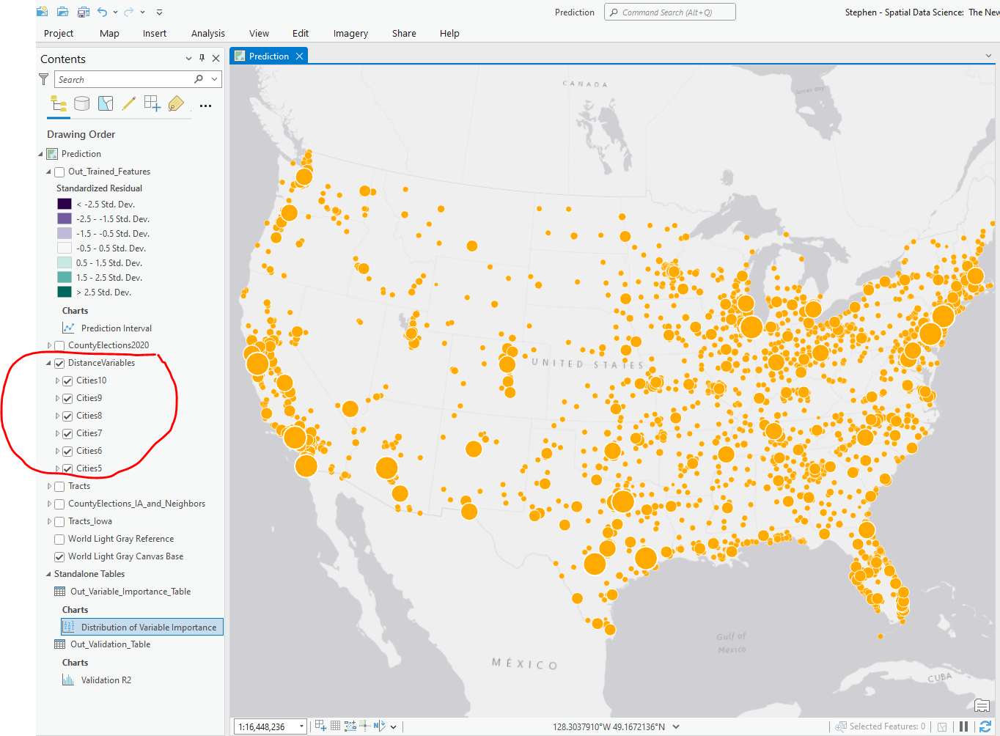

Each Cities layer in the DistanceVariables group layer represents a class of city size based on population. Cities10 represents cities with the largest populations, and Cities5 represents the cities with the smallest populations.

3. Turn off the DistanceVariables group layer.

4. Click Cities10 to select it, and then press Shift and click Cities5.

The six distance variables are selected.

5. Drag the selected layers into the Geoprocessing pane, under Explanatory Training Distance Features.


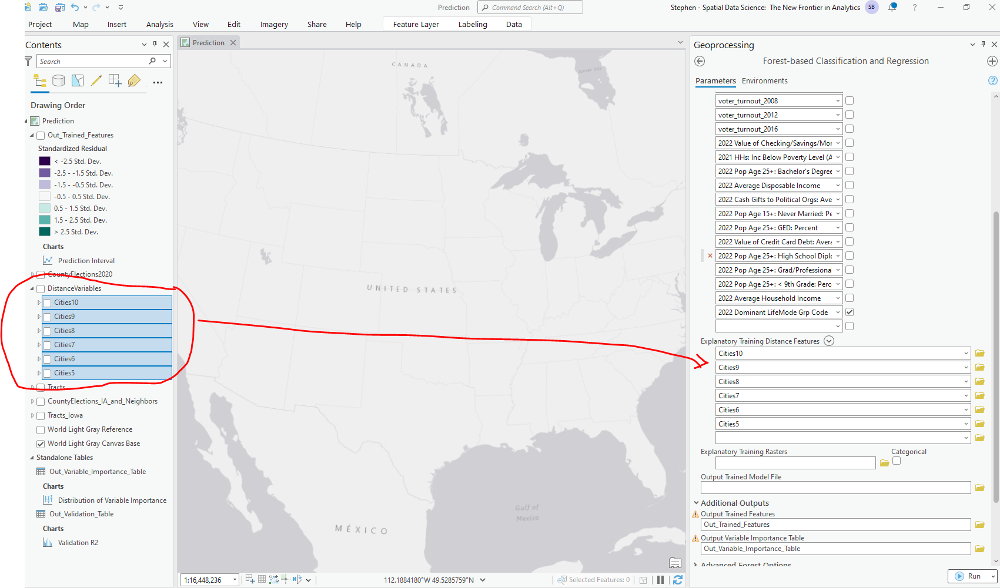


6. Click Run.

>Note: The tool may take a few minutes to run.

7. In the Contents pane, right-click `Out_Trained_Features` and choose Attribute Table.

8. In the attribute table, scroll to the Cities attribute fields.

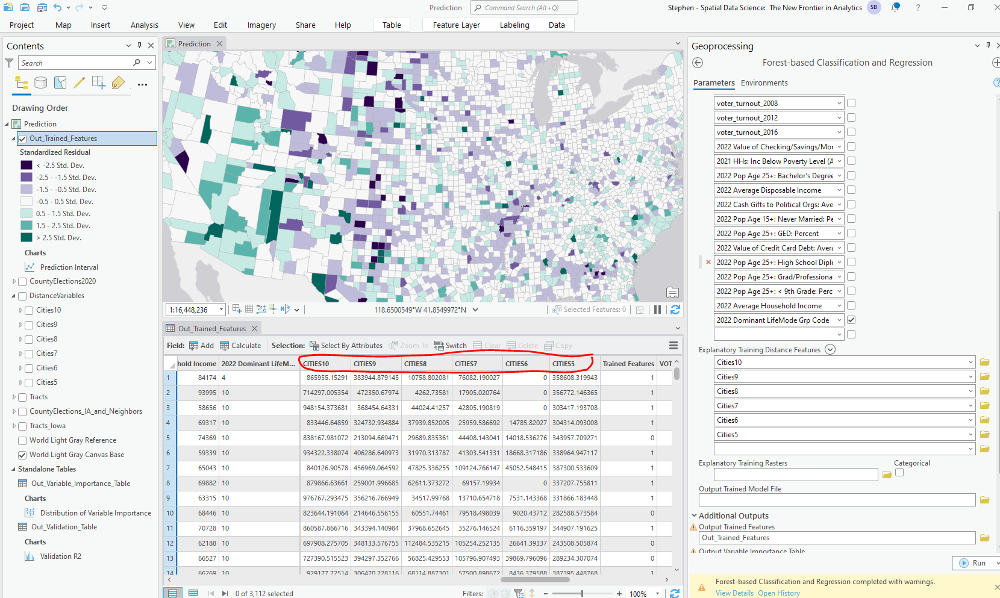


>Note: When a city point is contained within a county, the distance will be zero.

The Forest-based Classification and Regression tool calculates the distances from each county to the nearest city of each class (the closest class 5 city, the closest class 6 city, and so on). These distances are added to the `Out_Trained_Features` layer as separate attribute fields.

9. Close the attribute table.

10. At the bottom of the Geoprocessing pane, click View Details.

11. In the tool message window, from the Messages tab, scroll to the Validation Data: Regression Diagnostics section.

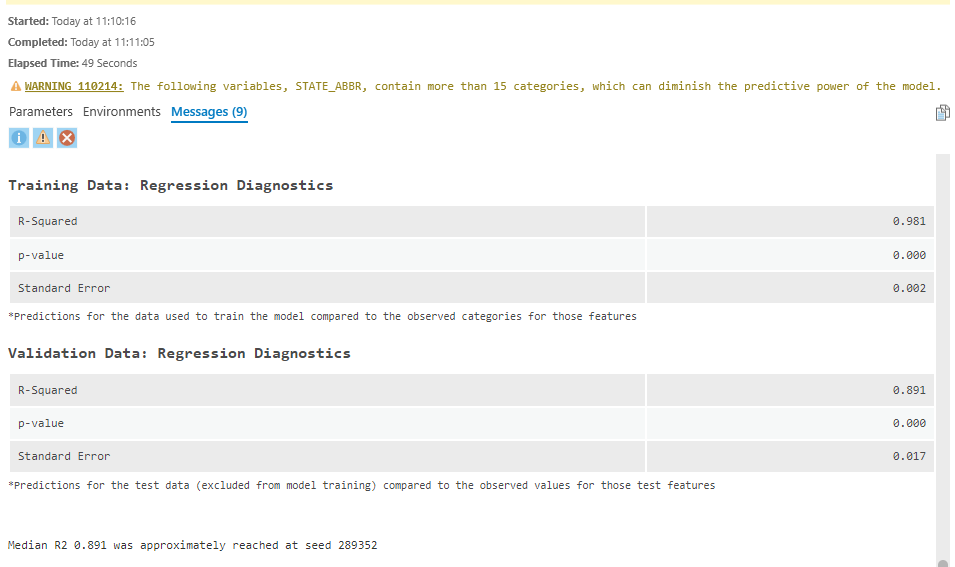

In this example, the model's R-squared value increased to `0.891`, which means that it is predicting with about 89 percent accuracy based on the validation data. You will review the variable importance chart to see how influential each distance variable is for the model performance. Remember that you may have slightly different results due to the randomness introduced into the algorithm.

12. Close the tool message window.

13. In the Contents pane, open the Distribution Of Variable Importance chart.

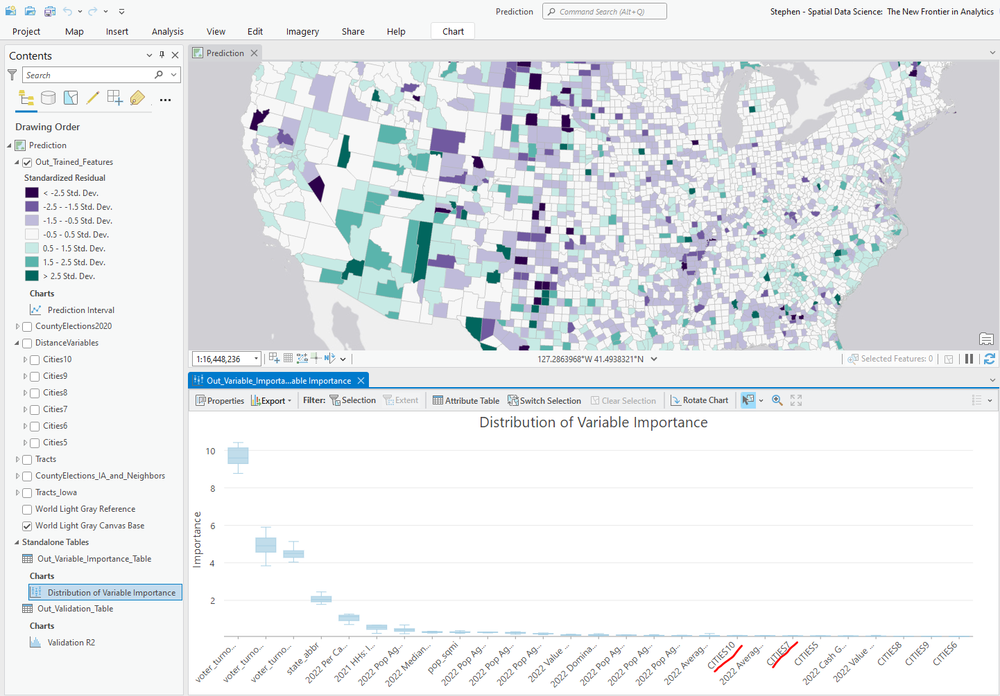

The distance to Cities7 and the distance to the largest cities (Cities10) are more important than the other distance variables. Overall, however, these variables were not as helpful as the income and voter turnout variables.

Identifying a "good" model is subjective and varies greatly based on the industry and how the model will be used. In many fields, including many of the social sciences, an R-squared value that is greater than 0.70 might be considered satisfactory for making a prediction. Before using this model to predict, you will simplify the model to include only the most important variables.

14. Close the Distribution Of Variable Importance chart and activate the Geoprocessing pane.

### **Step 7: Refine the model**

Refining your model is typically an iterative process, where you remove some variables and then rerun and evaluate the model. There are many different ways to select variables to include in a model. In this analysis, the most important variables are chosen by defining a threshold in the variable importance table. In this step, you will refine the model to only include the variables with variable importance above the selected threshold.

1. In the Contents pane, turn off the `Out_Trained_Features` layer.

2. In the Geoprocessing pane, hover your mouse over the `2022 Value Of Checking/Savings/Money Mkt/CDs: Average` variable.

A red X appears next to the variable. When you click the red X, the variable is removed from the list.

3. Click the red X to the left of the 2022 Value Of Checking/Savings/Money Mkt/CDs: Average variable.

4. Click the red X for the following variables to remove them from the model:

- 2022 Pop Age 25+: Bachelor's Degree: Percent
- 2022 Average Disposable Income
- 2022 Cash Gifts To Political Orgs: Average
- 2022 Pop Age 25+: GED: Percent
- 2022 Value Of Credit Card Debt: Average
- 2022 Pop Age 25+: High School Diploma: Percent
- 2022 Pop Age 25+: Grad/Professional Degree: Percent
- 2022 Pop Age 25+: < 9th Grade: Percent
- 2022 Average Household Income
- 2022 Dominant LifeMode Grp Code

You refined the model by removing the explanatory training variables that had the least importance for the model. You will also remove all of the distance variables because of their lower variable importance scores. 

5. Under Explanatory Training Distance Features, remove all of the distance variables.

6. Scroll down and expand Advanced Forest Options.

7. For Number Of Trees, type 1000.

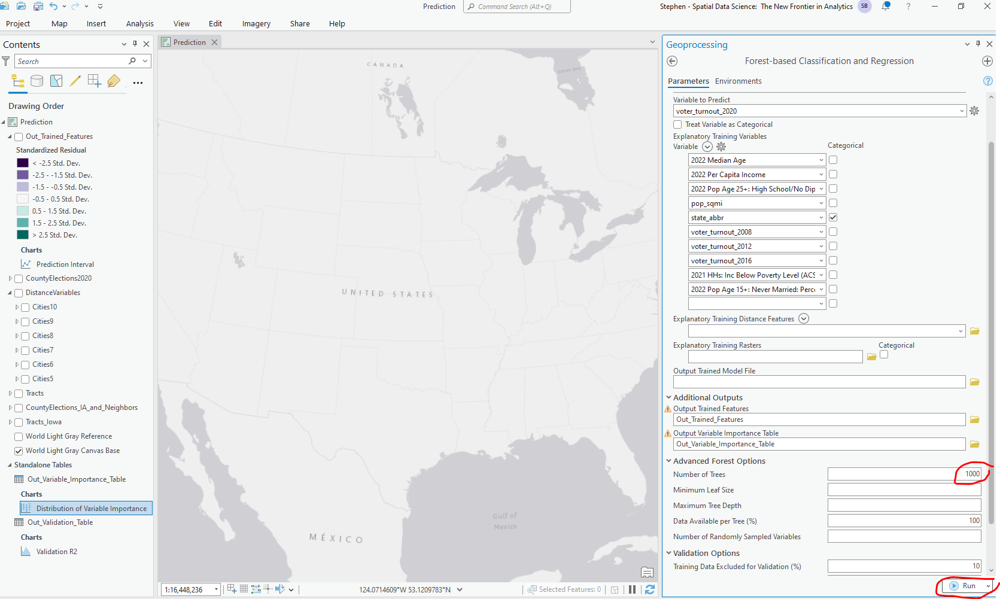

Increasing the number of trees improves the chance that each variable will be used in a decision tree, resulting in a more accurate model prediction. Specifying the number of trees is a balance between the accuracy of the model and the processing time to generate the model.

8. Run the tool.

>Note: Because of the increased number of trees, the tool may take a few minutes to run.

Review the tool message window and various charts to answer the following questions.

> Note: Remember that each time you run the Forest-based Classification and Regression tool, you may get slightly different results due to the randomness introduced into the algorithm.

- What is the validation R-squared value for this model?

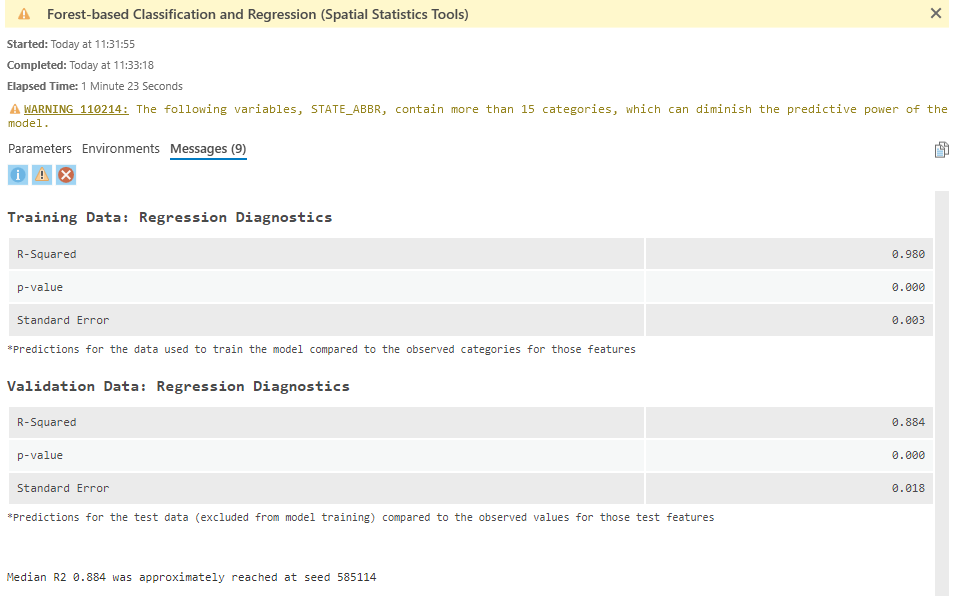

The validation R-squared value for this model is `0.884`.

- What is the `mean` R-squared value over the 10 runs of this model?

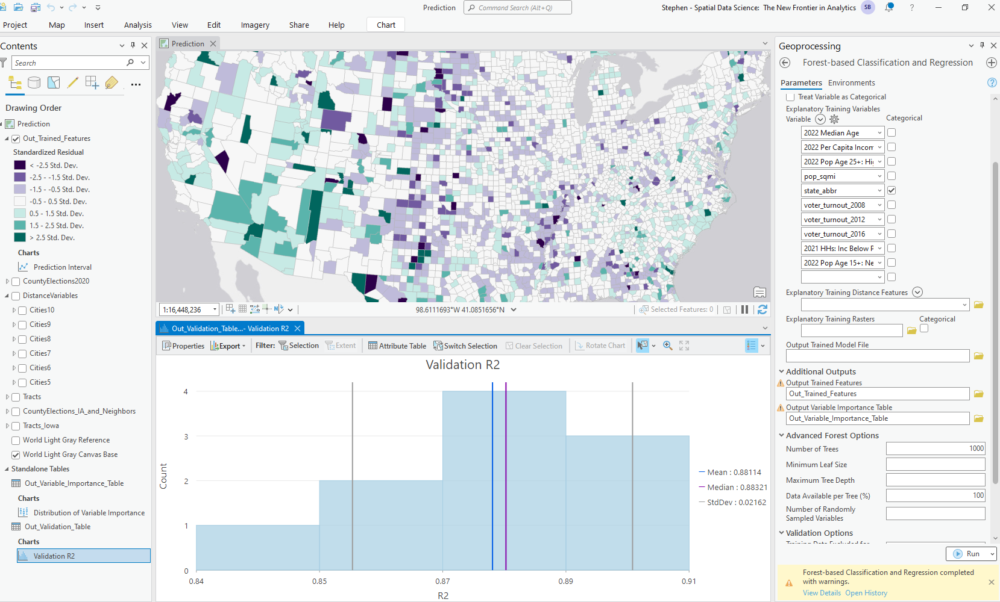


The mean R-squared value over the 10 runs of this model is `0.88114`.

- What are the two most important explanatory variables in this model?

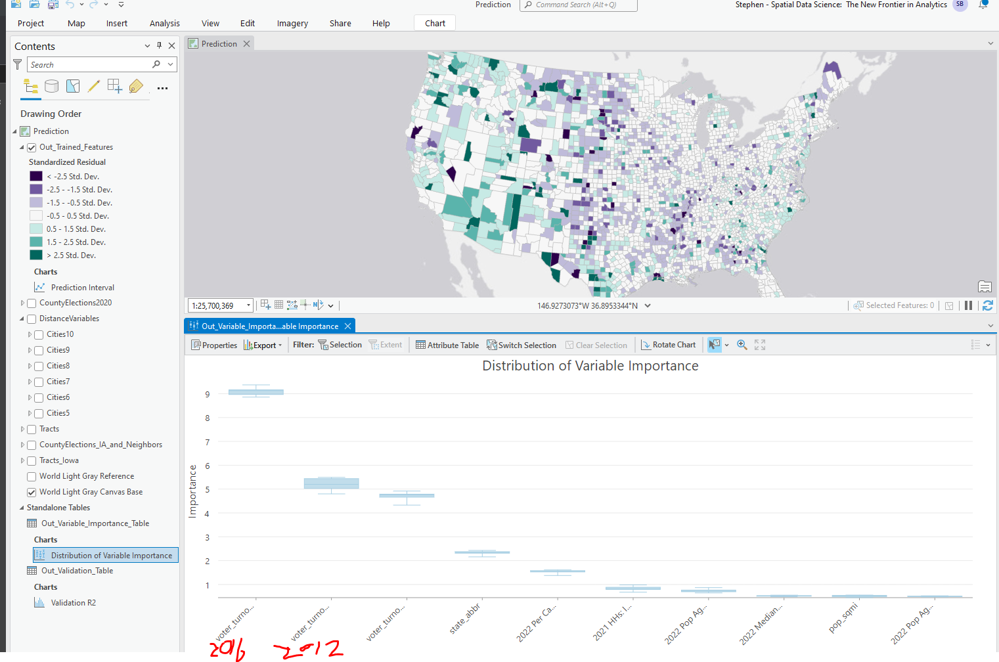

The two most important explanatory variables are `voter_turnout_2016` and `voter_turnout_2012`.

The simplified model has only a slightyl lower R-squared value (0.884 vs. 0.891), meaning that removing the variables with low importance did not compromise model performance materially.

9. Close the charts.

### **Step 8: Examine additional model metrics**

Next, you will review additional model metrics to help you assess whether the model requires any additional changes.

1. If necessary, in the Geoprocessing pane, reopen the Forest-based Classification And Regression tool message window.

2. On the Messages tab, review the Model Out Of Bag Errors section.

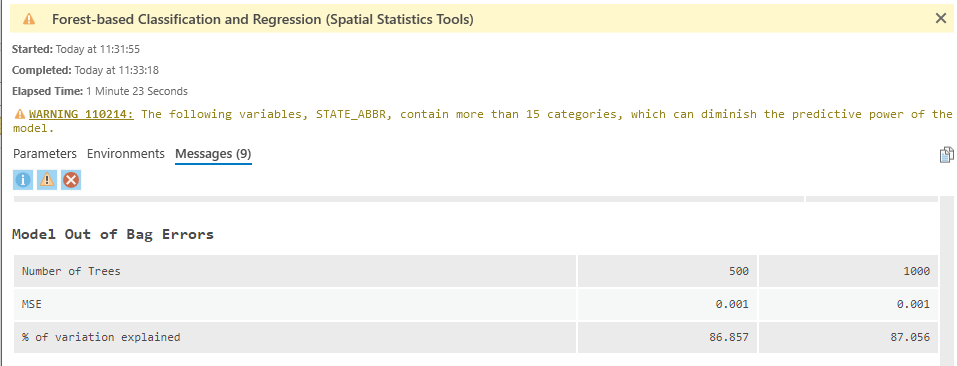


Model Out Of Bag Errors is another diagnostic that can help validate the model. The percentage of variation explained indicates the percentage of variability in voter turnout that can be explained using this model. Model Out Of Bag Errors also shows how much performance is gained by increasing the number of trees in the model. If the percentage of variation explained significantly increases from the 500 to the 1000 column, you may want to increase the number of trees to improve model performance.

This model does not see a significant increase in percentage of variation explained, so you do not need to increase the number of trees. Remember: due to the randomness built into algorithms, varied results are expected.

3. Scroll to the Explanatory Variable Range Diagnostics section.

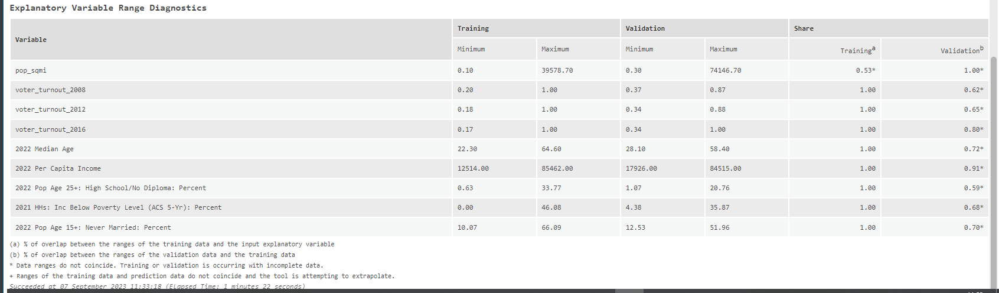

> Note: You may need to widen the window to see the full table in this section.

The Explanatory Variable Range Diagnostics section lists the range of values covered by each explanatory variable in the datasets that are used to train and validate the model. For example, median age values spanned from 22 to 64 in the dataset that is used to train the model and from 28 to 58 in the dataset that is used to validate the model.

The Share column indicates the percentage of overlap between the values that are used to train and the values that are used to validate. In this example, 80 percent of the median age values that are used to train the model were used to validate the model. A value that is greater than 1 indicates that the model predicted values outside the range of values in the training data. To minimize extrapolation, you will review this diagnostic as you predict voter turnout for census tracts.

For more information about these additional model metrics, go to ArcGIS Pro Help: [Output messages and diagnostics](https://pro.arcgis.com/en/pro-app/tool-reference/spatial-statistics/how-forest-works.htm#ESRI_SECTION1_E010566C782444E2B2364442355FC50D).

4. Close the tool message window.

5. In the Contents pane, turn off the `Out_Trained_Features` layer

### **Step 9: Predict values**

You trained a model using the county data that you had available. You can use this model to predict voter turnout at the census tract level, which is much higher resolution (more granular) and will allow you to get a sense of more detailed spatial patterns.

To predict voter turnout at the tract level, you need census tract data with explanatory variables that match the explanatory variables that are used to train the model. In this step, you will train the model using the county data and then apply that model to the same variables at the tract level to predict voter turnout.

1. In the Contents pane, turn on the Tracts layer.

>Note: Tracts that were not relevant to this analysis (for example, airports and national parks) were removed.

2. Near the top of the Geoprocessing pane, for Prediction Type, choose Predict To Features.

3. Scroll down the Geoprocessing pane and for Input Prediction Features, choose Tracts.

4. For Output Predicted Features, type `Out_Predicted_Features`.

The prediction features must include the variables that are used to train the model, but the variables do not have to have the same names. You can use the Match Explanatory Variables selections to match the variables using their respective names.

5. Under Match Explanatory Variables, under Prediction, for the empty cell next to 2022 Median Age, click the down arrow. 

6. Review the available variables in the Tracts layer and answer the question.

- Q. Which variables used to train the model at the county level are not included in the Tracts layer?

- A. The Tracts layer does not include voter turnout data.

The Tracts layer was provided to you by a different analyst and did not go through the same data engineering steps that you completed. Because of that, you will delete the voter turnout variables from Explanatory Training Variables. 

7. Scroll up in the Geoprocessing pane.

8. Under Explanatory Training Variables, remove the following variables:

- voter_turnout_2008
- voter_turnout_2012
- voter_turnout_2016

9. Under Match Explanatory Variables, under Prediction, for the empty cells, click the down arrow and choose the matching training variable name.

Your variables should match the following graphic, which displays the completed list of matching explanatory variables.

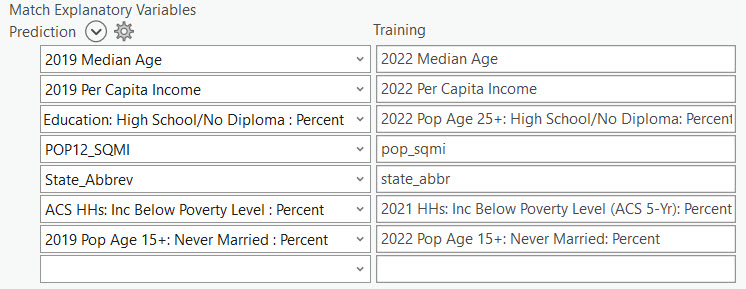

>Note: Ensure that you match all the variables in the list.

For the purpose of this analysis, using 2019 variables is acceptable because the difference between 2019 values and 2021 or 2022 values is minimal.

10. Scroll down and, if necessary, expand Additional Outputs.

11. For Output Trained Features, delete `Out_Trained_Features`.

12. If necessary, expand Validation Options.

13. For Training Data Excluded For Validation, confirm that it is still set to 10.

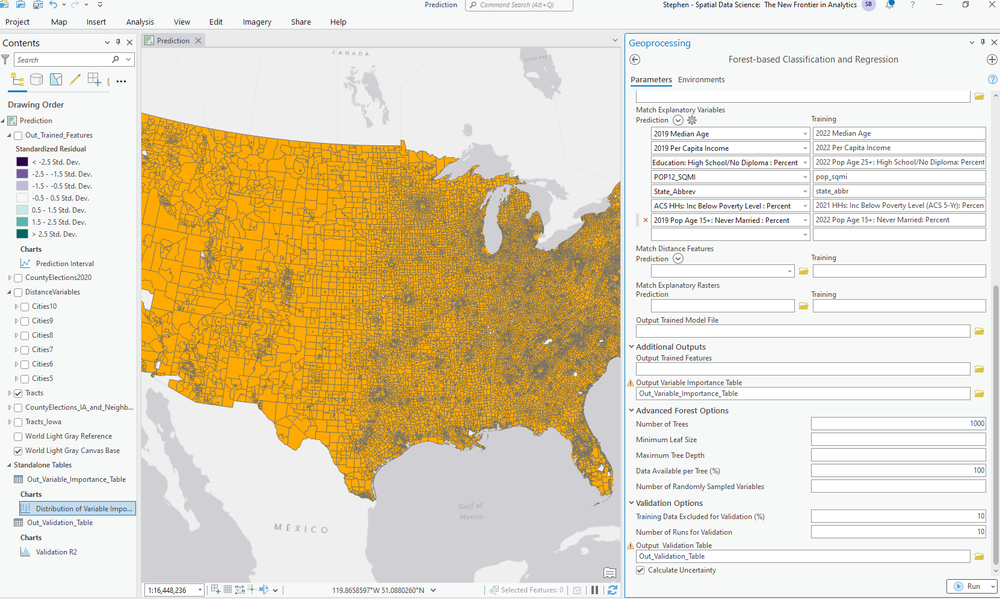

By removing the voter turnout variables, you changed the model. Because of this change, you will leave Training Data Excluded For Validation as 10 percent so you can assess model performance at the Tract level. If the variables had remained the same, you no longer need to assess the model's performance and you could change this parameter to 0 to use all the training data to train the model so that the model can predict to the best of its ability.

14. Run the tool.

>Note: The tool may take a few minutes to run.

15. When the tool is complete, open the tool message window.

The Model Out Of Bag Errors uses training data to evaluate how well each tree in the model predicts, so you will focus on this metric.

16. Scroll to the Model Out Of Bag Errors section.

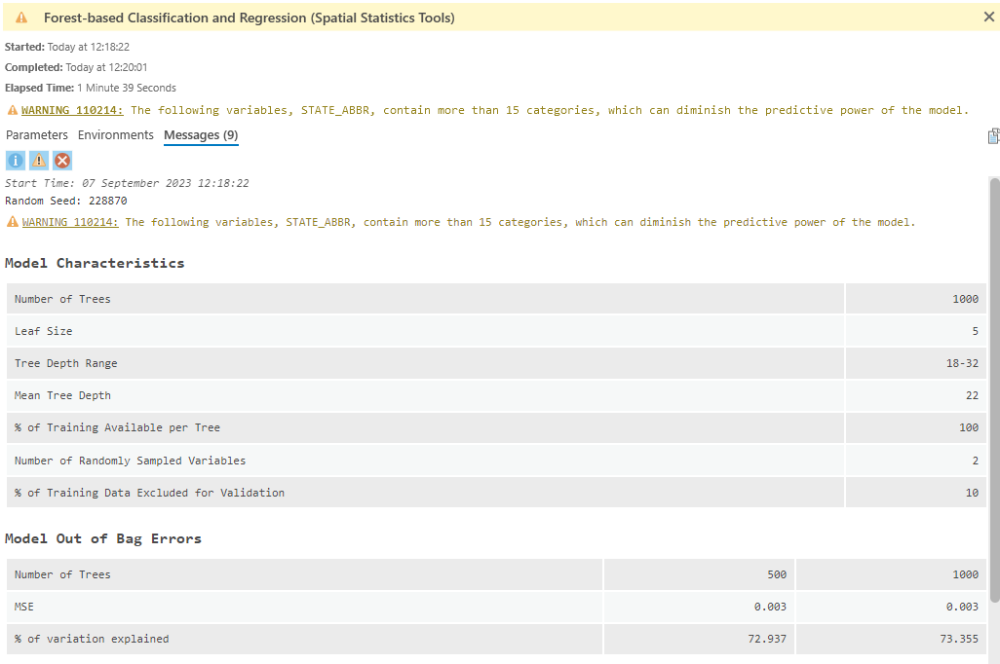

The percentage of variation explained was reduced, but it does not vary greatly between 500 trees and 1,000 trees. Because it does not vary much between 500 and 1000, there is no need to run the model again with more trees.

17. Close the tool message window.

18. In the Contents pane, under `Out_Predicted_Features`, right-click Prediction Interval and choose Open.

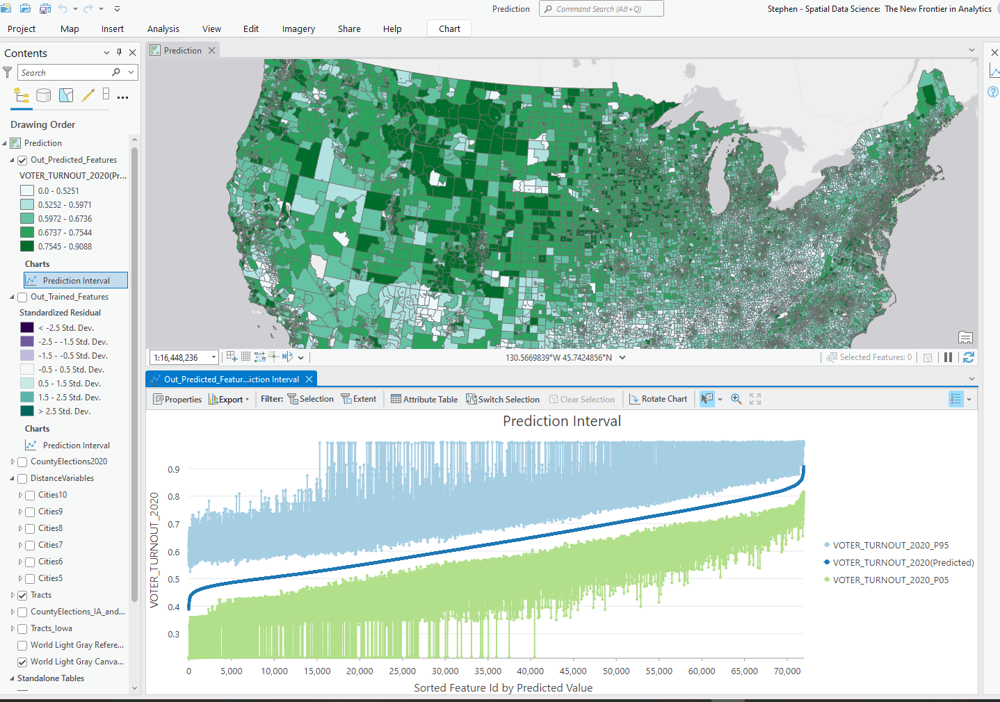

The wide confidence intervals show that the model does not perform as well at the tract level as it did at the county level. In particular, it may be prone to overestimating turnout for low-turnout tracts. Because the goal of your analysis is to identify areas with low voter turnout, this model is not reliable enough to meet your needs. 

When you change the scale of your analysis, you need to change or update your model. In this scenario, votes in the United States are mostly calculated at the county level and are not calculated at the tract level. You saw that tract-level prediction does not work nationwide. The factors that drive voter turnout are likely very different from place to place, making it difficult to find a model that predicts well for the entire country. It is often a good practice to reduce your study area and create more localized models. 

You can end your analysis here or you can continue modifying and improving the model by reducing your study area to create a more localized model. Remember: your model will not be perfect. Your goal is to find a model that is useful for your objective, which, in this case, is a campaign to get out the vote.

19. If you would like to continue this analysis, proceed to the optional stretch goal; otherwise, close all the charts, save the project, and exit ArcGIS Pro.